**Pattern Recognition in Daily Top Trending YouTube Videos**
---



In [ ]:
import requests
import os
import argparse
import matplotlib.pyplot as plt
import cv2
from imutils import paths
import numpy as np
from tqdm import tqdm
from keras.preprocessing import image
from PIL import Image
from mpl_toolkits.mplot3d import Axes3D
import pylab as pl
import glob
from sklearn.cluster import KMeans
from sklearn import datasets, metrics
import matplotlib.image as mpimg
import random
from __future__ import division
import matplotlib.gridspec as gridspec
from neupy import architectures, storage, algorithms, utils
from numpy import array
from keras.applications.vgg19 import VGG19, preprocess_input
from keras.models import Model
from keras.preprocessing.image import load_img, img_to_array
from keras.applications import imagenet_utils
%matplotlib inline

**Load Data From Google Drive**

In [0]:
import pandas as pd
from google.colab import drive

drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


**Read-in CSV**

In [0]:
united_states_video_path = "/content/drive/My Drive/cs6140 project/data/USvideos.csv"
videos = pd.read_csv(united_states_video_path)

In [0]:
videos.head()

,video_id,trending_date,title,channel_title,category_id,publish_time,tags,views,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,video_error_or_removed,description
0,2kyS6SvSYSE,17.14.11,WE WANT TO TALK ABOUT OUR MARRIAGE,CaseyNeistat,22,2017-11-13T17:13:01.000Z,SHANtell martin,748374,57527,2966,15954,https://i.ytimg.com/vi/2kyS6SvSYSE/default.jpg,False,False,False,SHANTELL'S CHANNEL - https://www.youtube.com/s...
1,1ZAPwfrtAFY,17.14.11,The Trump Presidency: Last Week Tonight with J...,LastWeekTonight,24,2017-11-13T07:30:00.000Z,"last week tonight trump presidency|""last week ...",2418783,97185,6146,12703,https://i.ytimg.com/vi/1ZAPwfrtAFY/default.jpg,False,False,False,"One year after the presidential election, John..."
2,5qpjK5DgCt4,17.14.11,"Racist Superman | Rudy Mancuso, King Bach & Le...",Rudy Mancuso,23,2017-11-12T19:05:24.000Z,"racist superman|""rudy""|""mancuso""|""king""|""bach""...",3191434,146033,5339,8181,https://i.ytimg.com/vi/5qpjK5DgCt4/default.jpg,False,False,False,WATCH MY PREVIOUS VIDEO ▶ \n\nSUBSCRIBE ► http...
3,puqaWrEC7tY,17.14.11,Nickelback Lyrics: Real or Fake?,Good Mythical Morning,24,2017-11-13T11:00:04.000Z,"rhett and link|""gmm""|""good mythical morning""|""...",343168,10172,666,2146,https://i.ytimg.com/vi/puqaWrEC7tY/default.jpg,False,False,False,Today we find out if Link is a Nickelback amat...
4,d380meD0W0M,17.14.11,I Dare You: GOING BALD!?,nigahiga,24,2017-11-12T18:01:41.000Z,"ryan|""higa""|""higatv""|""nigahiga""|""i dare you""|""...",2095731,132235,1989,17518,https://i.ytimg.com/vi/d380meD0W0M/default.jpg,False,False,False,I know it's been a while since we did this sho...


## **Hypotheses**

Sub-Experiment #2: **Video Thumbnail Image Analysis**:
- Given a video, use web scraping to get thumbnails from given links:
- perform clustering on thumbnail images
- perform analysis of clusters with number of views, comments and likes
- Come up with a Hypothesis and then test on some new data.


## **Thumbnail Image Analysis**

# **1 - Scrape site and download images**

# Access the Thumbnail links and download Images.

```
import requests
import os
import argparse
path = "images"  # relative path of folder to store the file images. 
total = 0 # keep track of number of images downloaded.
## Get urls from Pandas data frame.
for index, row in videos.iterrows():
    url = row['thumbnail_link'] # get the thumbnail url. the thubmnails aren't unique

    ## Get image from url and store in data.
    try:
        # try to download the image
        r = requests.get(url, timeout=60)
        
        #print(r.status_code)
        # save the image to disk
        p = os.path.join(path, str(index) + ".jpg")
        # create file pointer and specify path, the write to file in binary format("wb")
        f = open(p, "wb")   
        f.write(r.content)
        f.close()

        # update the counter
        total += 1
        print(str(total) + " [INFO] downloaded: {}".format(p))
    

    # handle if any exceptions are thrown during the download process
    except:
        print("[INFO] error downloading {}...skipping".format(p))

# check if all images were taken
assert(total == 40949), "All links had valid image files" # assert returns true hence all links are valid.
```

# Verify that all images can be opened (No bad images)

```
import cv2
from imutils import paths

badFiles = []
# loop over the image paths we just downloaded
for imagePath in list(paths.list_images('/images')):
	# initialize if the image should be deleted or not
	delete = False
 
	# try to load the image
	try:
		image = cv2.imread(imagePath)
 
		# if the image is `None` then we could not properly load it
		# from disk, so delete it
		if image is None:
			delete = True
 
	# if OpenCV cannot load the image then the image is likely
	# corrupt so we should delete it
	except:
		print("Except")
		delete = True
 
	# check to see if the image should be deleted
	if delete:
		badFiles.append(imagePath)

print(badFiles) # list returns empty hence all image files can be opened.
```



## Remove bad images from dataset (Pre-processing)




```
def remove_duplicates(dir):
    for filename in os.listdir(dir):
        file_path = os.path.join(dir, filename)
        bad_image = os.path.join(os.getcwd(), "bad.jpg")    # store bad image.
        img = cv2.imread(filename, 1)
        if open(file_path, "rb").read() == open(bad_image, "rb").read():    # check if two images are the same.
            os.remove(file_path)
            print("removed : ", filename)

remove_duplicates("images/")
```



Removing bad images reduced the data set size from 6455 to 6082.

# **2 - Load images and Perform Unsupervised Image clustering**

Start with Feature extraction and then move to Dimensionality reduction (from m to p space)
*   Color-based
*   Texture-based
*   Shape-based
*   Deep Methods

Next, use K means to cluster images accordingly.





## 1.   **Color-based**


In [0]:
path = "/content/drive/My Drive/cs6140 project/images/"
files = glob.glob (path + "*.jpg")  # get files

# number of images to use or U-matrix. Can be changed to whatever.
# n_images = 1001
n_images = len(files) + 1

Using TensorFlow backend.


## **Feature 1: RGB Scatter plot**

**Displaying a few images to have a picture of the dataset**

In [0]:
# Zero mean input for preprocessing layer by subtracting the mean image values.
def process(image):
    mean = [103.939, 116.779, 123.68]
    image[..., 0] -= mean[0]
    image[..., 1] -= mean[1]
    image[..., 2] -= mean[2]
    return image

5420
(5385, 224, 224, 3)


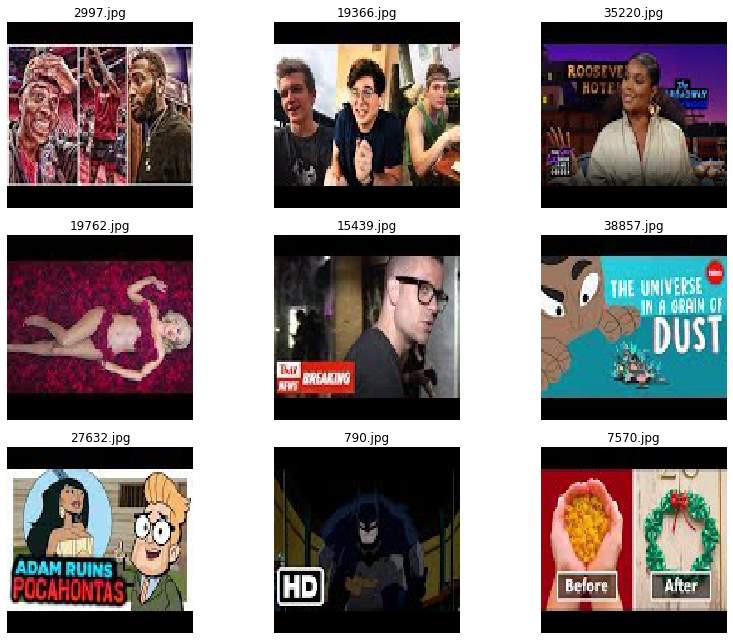

In [0]:
fig = plt.figure(figsize=(12, 9)) # to display 10 images.
count = 1
print(len(files))
images = [] # store images.
preprocess = imagenet_utils.preprocess_input
for file_path in files:
    try:
      image = load_img(file_path, target_size=(224, 224))

      if count < 10:
        plt.subplot(3, 3, count)
        plt.title(os.path.basename(file_path)) # extract file name
        plt.imshow(image)
        plt.axis('off')
        
      # add image to images array.
      if count == n_images: break
      image = img_to_array(image) # convert image pixels to a numpy array
      image = np.expand_dims(image, axis=0)
      image = process(image) # subtract the mean RGB value computed on the training set from each pixel.
      images.append(image)
      count += 1
    
    except: # catch any exceptions
      count += 1
      continue
        
#
images = np.concatenate(images, axis = 0)
print(images.shape)
fig.tight_layout()

***Find mean of all pixels in Image and store images in array.***

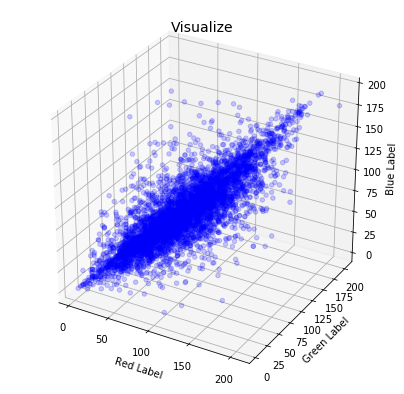

In [0]:
red, green, blue = [], [], []
count = 0

for file in files:
    if (count == n_images): break
    count += 1

    try:
        img = Image.open(file, 'r')
        pix_val = list(img.getdata())
        red_color, green_color, blue_color = 0, 0, 0
        for sets in pix_val:
            red_color += sets[0]
            green_color += sets[1]
            blue_color += sets[2]

        red.append(red_color / len(pix_val))
        green.append(green_color / len(pix_val))
        blue.append(blue_color / len(pix_val))
    
    except OSError:
        continue

#images = np.concatenate(images, axis=0)

fig = plt.figure(None, figsize=(7,7))
ax = fig.add_subplot(111, projection='3d')

ax.scatter(red, green, blue, c='b', marker='o', alpha=0.2)

ax.set_xlabel('Red Label')
ax.set_ylabel('Green Label')
ax.set_zlabel('Blue Label')
plt.title("Visualize", fontsize=14)
plt.show()

### Perform K Means clustering with this extracted feature

Text(0.5, 0.92, 'K Means')

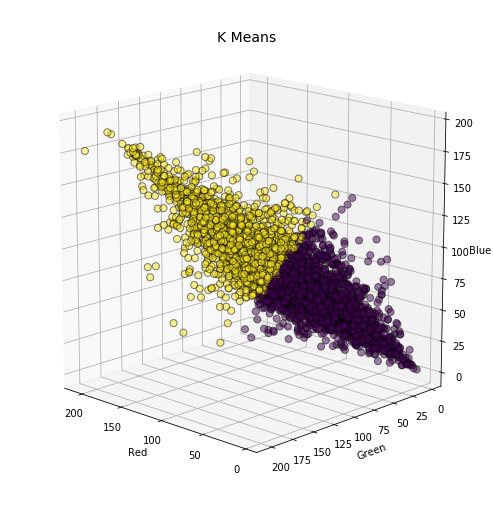

In [0]:
# KMeans clustering
X = []
num_clusters = 2
for i in range(len(red)): # Create 3D array of RGB values.
    r, g, b = red[i], green[i], blue[i]
    X.append([r, g, b])

km = KMeans(n_clusters = num_clusters)
km.fit(X)
km.predict(X)
labels = km.labels_ #Plotting
fig = plt.figure(1, figsize=(7,7))
ax = Axes3D(fig, rect=[0, 0, 0.95, 1], elev=15, azim=134)
ax.scatter(red, green, blue,
           c=labels.astype(np.float), edgecolor="k", s=50, alpha=.5)
ax.set_xlabel("Red")
ax.set_ylabel("Green")
ax.set_zlabel("Blue")
plt.title("K Means", fontsize=14)

#### From applying K means with 4 clusters, we can't really differentiate the data points clearly. Hence, we need more features. We examine the performance of the feature space with the ***Silhouette Coefficient*** in Sci-kit learn.

In [0]:
metrics.silhouette_score(X, labels, metric='euclidean')

0.46567028465272337

## **Next, is we try to identify the best number of clusters for our dataset.**

### Internal cluster validation with Silhouette coefficient.
where a higher Silhouette Coefficient score relates to a model with better defined clusters. The Silhouette Coefficient is defined for each sample and is composed of two scores:
1.   The mean distance between a sample and all other points in the same class.
2.   The mean distance between a sample and all other points in the next nearest cluster.
- The score is bounded between -1 for incorrect clustering and +1 for highly dense clustering. Scores around zero indicate overlapping clusters.
- The score is higher when clusters are dense and well separated, which relates to a standard concept of a cluster.


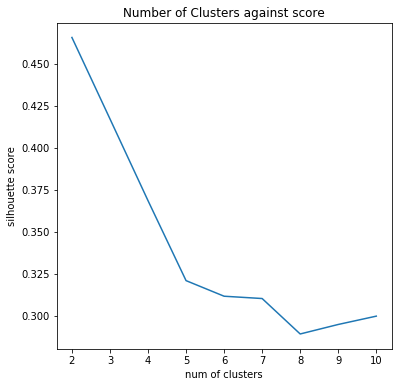

In [0]:
# experiment with clusters from 2 to 10.
cluster_scores = {}  # dictionary to score clustering scores.
for num_of_clusters in range(2, 11):
  km = KMeans(n_clusters = num_of_clusters)
  km.fit(X)
  km.predict(X)
  labels = km.labels_#Plotting
  score = metrics.silhouette_score(X, labels, metric='euclidean')
  cluster_scores[num_of_clusters] = score

# Plot graph.
scores = sorted(cluster_scores.items())
clusters, score = zip(*scores) # unpack a list of pairs into two tuples
plt.figure(figsize=(6,6)) # set the size of plot.
plt.plot(clusters, score)
plt.title('Number of Clusters against score')
plt.ylabel('silhouette score')
plt.xlabel('num of clusters')
plt.show()

### We realize that the optimam number of clusters with the ***mean RGB values*** as features is 2.

## **Feature 2 - Texture-based**

**- Apply Gabor Filter to image as from [link text](https://github.com/Shikhargupta/computer-vision-techniques/blob/master/GaborFilter/gabor.py)**


The extracted features will then be fed into a classifier (neural network, SVM classifier etc.) which then further trains the classifier.

From the Link:
- The input image is convolved with each of the filters. So, now we have 40 different images (response matrices) corresponding to one input.
- Now, we have to extract features from each image. Several features could be used but here we have used 2:
- Local Energy - Summing up the squared values of each element of response matrix.
- Mean Amplitude - Summing up the absolute value of each element of the response matrix.
- Hence for every response matrix we have 2 values - its local energy and mean amplitude. 2 seperate matrices are formed for each value and are appended in the corresponding matrix for each response matrix. So now, we have 2 matrices of 1x40 size corresponding to each input image. Append one matrix to the other. This single matrix acts as the feature vector for the input image.


In [0]:
# define gabor filter bank with different orientations and at different scales
def build_filters():
	filters = []
	ksize = 9
	#define the range for theta and nu
	for theta in np.arange(0, np.pi, np.pi / 8):
		for nu in np.arange(0, 6*np.pi/4 , np.pi / 4):
			kern = cv2.getGaborKernel((ksize, ksize), 1.0, theta, nu, 0.5, 0, ktype=cv2.CV_32F)
			kern /= 1.5*kern.sum()
			filters.append(kern)
	return filters

#function to convolve the image with the filters
def process(img, filters):
	accum = np.zeros_like(img)
	for kern in filters:
		fimg = cv2.filter2D(img, cv2.CV_8UC3, kern)
		np.maximum(accum, fimg, accum)	# get element-wise maximum between filter and accum.
	return accum

In [0]:
count = 0
feature_vectors = []
for file in files:
    if (count == n_images): break
    count += 1

    try:
      #instantiating the filters
      filters = build_filters()

      f = np.asarray(filters)

      #reading the input image in RGB Format
      imgg = cv2.imread(file)

      # convert to gray image to reduce dimensionality.
      imgg = cv2.cvtColor(imgg, cv2.COLOR_BGR2GRAY)
      
      #initializing the feature vector
      feat = []

      #calculating the local energy for each convolved image
      for j in range(40):
        res = process(imgg, f[j])
        temp = 0
        for p in range(90):
          for q in range(120):
            temp = int(temp) + int(res[p][q])*int(res[p][q])
        feat.append(temp)
      
      #calculating the mean amplitude for each convolved image	
      for j in range(40):
        res = process(imgg, f[j])
        temp = 0
        for p in range(90):
          for q in range(120):
            temp = temp + abs(res[p][q])
        feat.append(temp)
      
      #feature matrix is the feature vector for the image
      feature_vectors.append(feat)

    except: # catch any exceptions
      continue

### Perform K means clustering with new features vector (80 x 1)

In [0]:
num_clusters = 2
km = KMeans(n_clusters = num_clusters)
km.fit(feature_vectors)
km.predict(feature_vectors)
labels = km.labels_ #Plotting

In [0]:
metrics.silhouette_score(feature_vectors, labels, metric='euclidean')

In [0]:
# experiment with clusters from 2 to 10.
cluster_scores = {}  # dictionary to score clustering scores.
for num_of_clusters in range(2, 11):
  km = KMeans(n_clusters = num_of_clusters)
  km.fit(feature_vectors)
  km.predict(feature_vectors)
  labels = km.labels_#Plotting
  score = metrics.silhouette_score(feature_vectors, labels, metric='euclidean')
  cluster_scores[num_of_clusters] = score

# Plot graph.
scores = sorted(cluster_scores.items())
clusters, score = zip(*scores) # unpack a list of pairs into two tuples
plt.figure(figsize=(6,6)) # set the size of plot.
plt.plot(clusters, score)
plt.title('Number of Clusters against score')
plt.ylabel('silhouette score')
plt.xlabel('num of clusters')
plt.show()

### Compare different clustering validation methods against number of clusters.

## **3 - Feed features vector to an Artificial Neural Network such as SOM(Self-Organizing map) to reduce the dimensionality of the feature vector and then perform clustering**.
Used [Neupy Tutorials](https://github.com/itdxer/neupy/blob/master/notebooks/Looking%20inside%20of%20the%20VGG19%20using%20SOFM.ipynb) for reference

## Initializing VGG19 Architecture

In [0]:
vgg19 = architectures.vgg19()
vgg19

/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:526: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:527: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:528: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:529: FutureWarning: Passing (type, 1) or 

(?, 224, 224, 3) -> [... 47 layers ...] -> (?, 1000)

## Loading pre-trained parameters from ImageNet

In [0]:
storage.load(vgg19, "/content/drive/My Drive/cs6140 project/vgg/vgg19.hdf5")

Instructions for updating:
Colocations handled automatically by placer.


## Propagating images through network

In [0]:
dense_2 = vgg19.end('dense_2')
batch_size = 16
outputs = []
#batch_x = np.reshape(batc, [-1, 28, 28, 1])
print(images.shape)
for batch in tqdm(range(0, len(images), batch_size)):
    output = dense_2.predict(images[batch:batch + batch_size])
    outputs.append(output)
    
dense_2_output = np.concatenate(outputs, axis=0)
dense_2_output.shape

  0%|          | 0/337 [00:00<?, ?it/s]

(5385, 224, 224, 3)


100%|██████████| 337/337 [52:22<00:00,  8.08s/it]


(5385, 4096)

## Train the SOM Neural nework on VGG19 Network.

In [0]:
# data normalization
#feature_vectors = np.apply_along_axis(lambda x: x/np.linalg.norm(x), 1, feature_vectors)

utils.reproducible()

sofm = algorithms.SOFM(
    #n_inputs = len(feature_vectors[0]),
    n_inputs = dense_2_output.shape[1],
    
    # Feature map grid is 2 dimensions and has
    # 900 output clusters (30 * 30).
    features_grid=(30, 30),
    
    # Closest neuron (winning neuron) measures
    # using cosine similarity
    distance='cos',
    
    # Sample weights from the data.
    # Every weight vector will be just a sample
    # from the input data. In this way we can
    # ensure that initialized map will cover data
    # at the very beggining.
    weight='sample_from_data',

    # Defines radius within we consider near by
    # neurons as neighbours relatively to the
    # winning neuron
    learning_radius=5,
    # Large radius is efficient only for the first
    # iterations, that's why we reduce it by 1
    # every 5 epochs.
    reduce_radius_after=5,

    # The further the neighbour neuron from the winning
    # neuron the smaller learning rate for it. How much
    # smaller the learning rate controls by the `std`
    # parameter. The smaller `std` the smaller learning
    # rate for neighboring neurons.
    std = 0.1,
    # Neighbours within 
    reduce_std_after = 5,
    
    # Learning rate
    step = 0.001,
    # Learning rate is going to be reduced every 5 epochs
    reduce_step_after=5,

    # Shows training progress in terminal
    verbose=True,
    
    # Shuffle data samples before every training epoch
    shuffle_data=True,
)
sofm.train(dense_2_output, epochs=10)



Main information

[ALGORITHM] SOFM

[OPTION] distance = ['cosine', 'cosine_similarity']
[OPTION] features_grid = [30, 30]
[OPTION] grid_type = ['rectangle', 'find_neighbours_on_rect_grid', 'find_step_scaler_on_rect_grid']
[OPTION] learning_radius = 5
[OPTION] n_inputs = 4096
[OPTION] n_outputs = None
[OPTION] reduce_radius_after = 5
[OPTION] reduce_std_after = 5
[OPTION] reduce_step_after = 5
[OPTION] show_epoch = 1
[OPTION] shuffle_data = True
[OPTION] signals = None
[OPTION] std = 0.1
[OPTION] step = 0.001
[OPTION] verbose = True
[OPTION] weight = sample_data



#1 : [53 sec] train: 2.012408


#2 : [52 sec] train: 2.011929


#3 : [52 sec] train: 2.011884


#4 : [52 sec] train: 2.011849


#5 : [43 sec] train: 2.011721


#6 : [43 sec] train: 2.011694


#7 : [43 sec] train: 2.011682


#8 : [43 sec] train: 2.011671


#9 : [43 sec] train: 2.011666
#10 : [37 sec] train: 2.011546


**Visualizing Self-Organizing Features map**

In [0]:
#1) Converting the image(s) from RGB to BGR 
#2) Subtracting the dataset mean from the image(s)
def deprocess(image):
    mean = [103.939, 116.779, 123.68]
    # Zero-center by mean pixel
    image[..., 0] += mean[0]
    image[..., 1] += mean[1]
    image[..., 2] += mean[2]
    return image

## Code to draw the U-Matrix

In [0]:
def draw_grid(sofm, images, output_features):
    data = images
    clusters = sofm.predict(output_features).argmax(axis=1)
    grid_height, grid_weight = sofm.features_grid
    
    plt.figure(figsize=(40, 40))

    grid = gridspec.GridSpec(grid_height, grid_weight)
    grid.update(wspace=0, hspace=0)

    for row_id in range(grid_height):
        print("Progress: {:.2%}".format(row_id / grid_weight))

        for col_id in range(grid_weight):
            index = row_id * grid_height + col_id
            clustered_samples = data[clusters == index]

            if len(clustered_samples) > 0:
                # We take the first sample, but it can be any
                # sample from this cluster (random or the one
                # that is closer to the center)
                sample = deprocess(clustered_samples[0])

            else:
                # If we don't have samples in cluster then
                # it means that there is a gap in space
                sample = np.zeros((224, 224, 3))

            plt.subplot(grid[index])
            plt.imshow(sample.astype('uint8'))
            #plt.imshow(sample)
            plt.axis('off')

    print("Progress: 100%")
    return sample

Progress: 0.00%
Progress: 3.33%
Progress: 6.67%
Progress: 10.00%
Progress: 13.33%
Progress: 16.67%
Progress: 20.00%
Progress: 23.33%
Progress: 26.67%
Progress: 30.00%
Progress: 33.33%
Progress: 36.67%
Progress: 40.00%
Progress: 43.33%
Progress: 46.67%
Progress: 50.00%
Progress: 53.33%
Progress: 56.67%
Progress: 60.00%
Progress: 63.33%
Progress: 66.67%
Progress: 70.00%
Progress: 73.33%
Progress: 76.67%
Progress: 80.00%
Progress: 83.33%
Progress: 86.67%
Progress: 90.00%
Progress: 93.33%
Progress: 96.67%
Progress: 100%


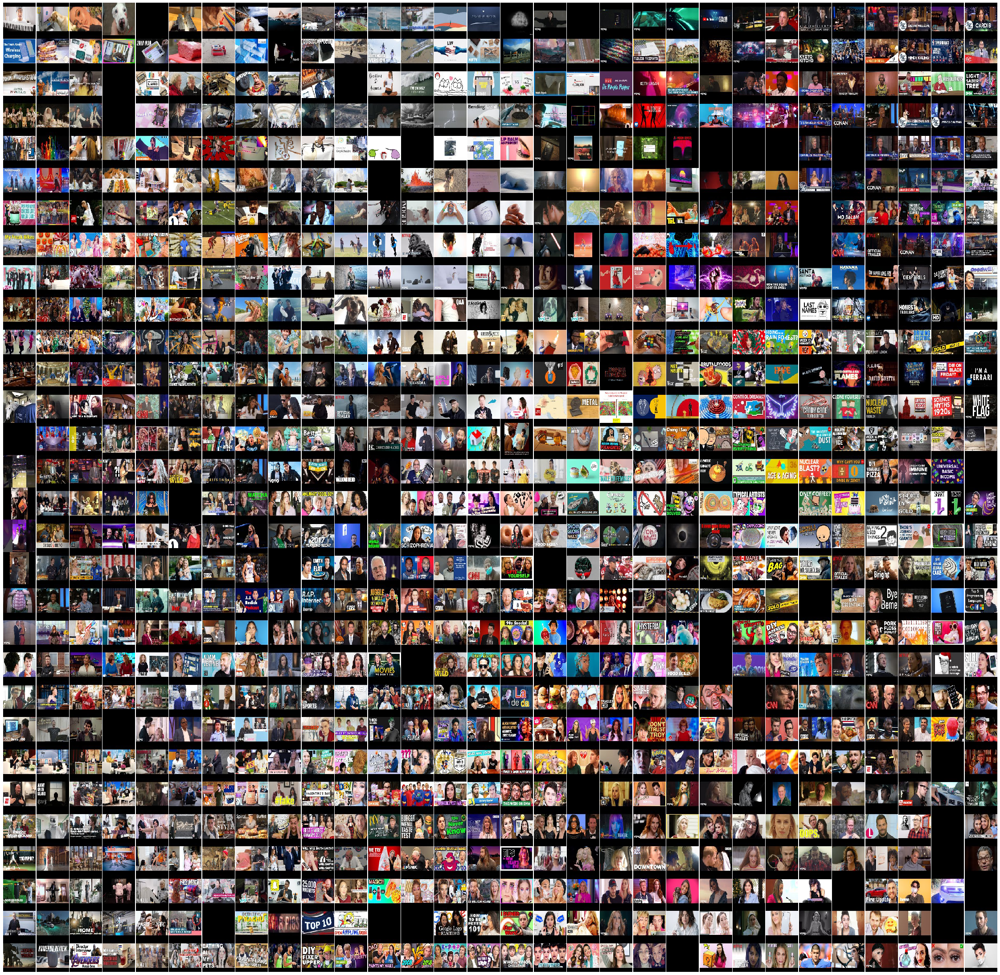

In [0]:
sample = draw_grid(sofm, images, dense_2_output)